In [ ]:
!pip install contextily

--- Шаг 1: Загрузка данных ---
✅ Данные из Zoon и Coffeemap успешно загружены.

--- Шаг 2: Стандартизация данных ---
✅ Датафреймы приведены к единой структуре.

--- Шаг 3: Фильтрация нерелевантных данных ---
✅ Из данных Coffeemap отфильтровано 304 заведений не из Москвы.

--- Шаг 4: Объединение датасетов ---
Общее количество заведений до дедупликации: 1390

--- Шаг 5: Умная гео-дедупликация ---
✅ Найдено и удалено 36 гео-дубликатов.
Итоговое количество уникальных заведений: 1354

--- Финальный результат ---
                       name        lat        lon  \
901   pine-coffee-cacao-bar  55.989612  37.220176   
1204              drinkit-2  55.773617  37.585098   
730         cappuccino-kids  55.682826  37.571229   
1192                 dablbi  55.622283  37.422629   
21             Кофе с собой  55.460874  38.449897   

                                                address  rating reviews_count  \
901                                                None     NaN          None   
1204  

/tmp/ipython-input-105-3699221783.py:61: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_cafes_raw = pd.concat([zoon_std, coffeemap_std], ignore_index=True)


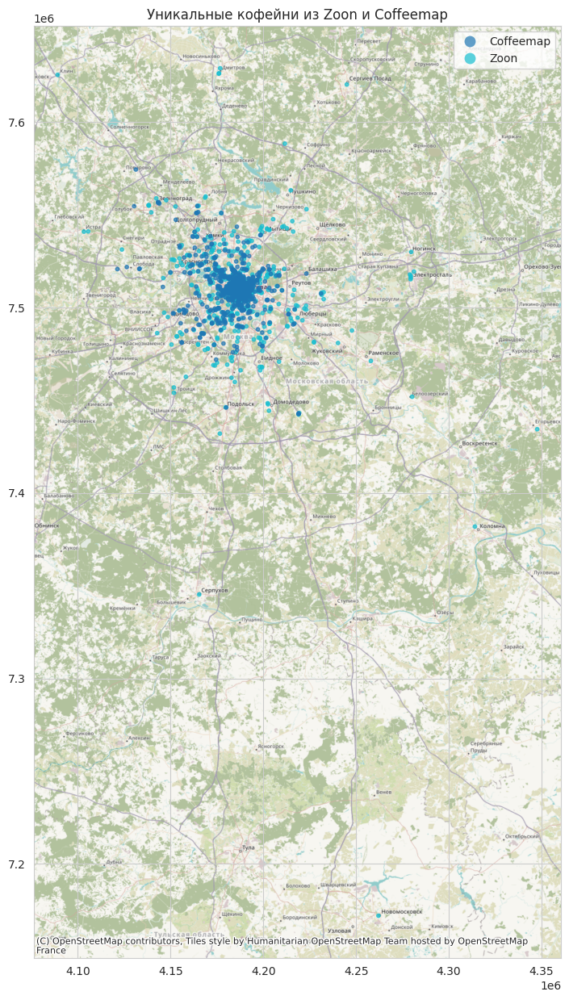

In [ ]:
import pandas as pd
import geopandas as gpd
import numpy as np
from sklearn.neighbors import BallTree
import contextily as cx
import matplotlib.pyplot as plt

# --- ШАГ 1: Загрузка данных ---
print("--- Шаг 1: Загрузка данных ---")
try:
    zoon_df = pd.read_csv('msc-coffe-zoon.csv')
    # Coffeemap - это JSON, который является списком словарей
    coffeemap_df = pd.read_json('msc-coffe-coffeemap.json')
    print("✅ Данные из Zoon и Coffeemap успешно загружены.")
except FileNotFoundError as e:
    print(f"❗️ Ошибка: файл не найден. {e}")
    # В реальном коде здесь можно прервать выполнение
    # raise e

# --- ШАГ 2: Стандартизация ---
# Наша цель - привести оба датафрейма к общей схеме:
# name, lat, lon, address, rating, tags, source

print("\n--- Шаг 2: Стандартизация данных ---")

# 2.1 Стандартизация Zoon
# Выбираем только нужные колонки
zoon_std = zoon_df[['name', 'lat', 'lon', 'address', 'rating', 'reviews_count', 'price_category', 'photo_count', 'tags']].copy()
zoon_std['source'] = 'Zoon' # Добавляем источник данных

# 2.2 Стандартизация Coffeemap
# Переименовываем 'lng' в 'lon' для соответствия
coffeemap_df.rename(columns={'lng': 'lon'}, inplace=True)
# В Coffeemap нет адреса и рейтинга, создадим пустые колонки
coffeemap_df['address'] = None
coffeemap_df['rating'] = None
coffeemap_df['reviews_count'] = None
coffeemap_df['price_category'] = None
coffeemap_df['photo_count'] = None
# Приводим теги (которые в виде списка) к строке, как в Zoon
coffeemap_df['tags'] = coffeemap_df['tags'].apply(lambda x: ', '.join(x) if isinstance(x, list) else x)

coffeemap_std = coffeemap_df[['name', 'lat', 'lon', 'address', 'rating', 'reviews_count', 'price_category', 'photo_count', 'tags']].copy()
coffeemap_std['source'] = 'Coffeemap'

print("✅ Датафреймы приведены к единой структуре.")

# --- ШАГ 3: Фильтрация ---
print("\n--- Шаг 3: Фильтрация нерелевантных данных ---")
# В данных Coffeemap есть точки не в Москве (lat ~42). Отфильтруем их.
# Границы Москвы примерно: lat от 55 до 56, lon от 37 до 38.
initial_count = len(coffeemap_std)
coffeemap_std = coffeemap_std[
    (coffeemap_std['lat'] > 55) & (coffeemap_std['lat'] < 56.2) &
    (coffeemap_std['lon'] > 37) & (coffeemap_std['lon'] < 38.2)
]
print(f"✅ Из данных Coffeemap отфильтровано {initial_count - len(coffeemap_std)} заведений не из Москвы.")

# --- ШАГ 4: Объединение (Concatenation) ---
print("\n--- Шаг 4: Объединение датасетов ---")
all_cafes_raw = pd.concat([zoon_std, coffeemap_std], ignore_index=True)
# Удалим строки, где нет координат
all_cafes_raw.dropna(subset=['lat', 'lon'], inplace=True)
print(f"Общее количество заведений до дедупликации: {len(all_cafes_raw)}")

# --- ШАГ 5: Умная гео-дедупликация ---
# Это самый важный и сложный шаг. Мы будем считать дубликатами точки,
# которые находятся очень близко друг к другу (например, в радиусе 100 метров).

print("\n--- Шаг 5: Умная гео-дедупликация ---")

# Превращаем наш DataFrame в GeoDataFrame
gdf = gpd.GeoDataFrame(
    all_cafes_raw,
    geometry=gpd.points_from_xy(all_cafes_raw.lon, all_cafes_raw.lat),
    crs="EPSG:4326" # Стандартная система координат WGS84
)

# Для поиска соседей используем BallTree, он эффективен для сферических координат
# Конвертируем градусы в радианы для BallTree
radians = np.radians(gdf[['lat', 'lon']].values)
tree = BallTree(radians, leaf_size=15)

# Задаем радиус поиска дубликатов в метрах
DISTANCE_METERS = 10
# Конвертируем метры в радианы
radius_radians = DISTANCE_METERS / 6371000  # Радиус Земли в метрах

# Находим для каждой точки всех ее соседей в заданном радиусе
indices_in_radius = tree.query_radius(radians, r=radius_radians)

# Алгоритм дедупликации
indices_to_drop = set()
visited_indices = set()

for i, neighbors in enumerate(indices_in_radius):
    if i in visited_indices:
        continue

    # Если у точки есть соседи (кроме нее самой)
    if len(neighbors) > 1:
        # Это кластер потенциальных дубликатов
        cluster_indices = list(neighbors)

        # Отмечаем все точки кластера как посещенные
        for idx in cluster_indices:
            visited_indices.add(idx)

        # Выбираем, какую точку из кластера оставить
        # Наша стратегия: предпочитаем Zoon (больше данных), затем - с лучшим рейтингом
        cluster_df = gdf.iloc[cluster_indices]
        zoon_entries = cluster_df[cluster_df['source'] == 'Zoon']

        if not zoon_entries.empty:
            # Если есть точки из Zoon, выбираем лучшую из них
            best_index = zoon_entries['rating'].idxmax()
        else:
            # Если все точки из Coffeemap, просто берем первую
            best_index = cluster_indices[0]

        # Добавляем все индексы КРОМЕ лучшего в список на удаление
        for idx in cluster_indices:
            if idx != best_index:
                indices_to_drop.add(idx)

# Удаляем найденные дубликаты
all_cafes_clean = gdf.drop(index=list(indices_to_drop))

print(f"✅ Найдено и удалено {len(indices_to_drop)} гео-дубликатов.")
print(f"Итоговое количество уникальных заведений: {len(all_cafes_clean)}")


# --- Финальная проверка и визуализация ---
print("\n--- Финальный результат ---")
print(all_cafes_clean.sample(5))

# Визуализируем результат на карте
print("\nОтрисовка карты с уникальными кофейнями...")
ax = all_cafes_clean.to_crs(epsg=3857).plot(
    figsize=(15, 15),
    alpha=0.7,
    markersize=10,
    column='source', # Раскрасим точки по источнику
    legend=True
)
cx.add_basemap(ax)
ax.set_title("Уникальные кофейни из Zoon и Coffeemap")
plt.show()


In [ ]:
# --- ШАГ 6: Сохранение результата в файл ---

print("\n--- Шаг 6: Сохранение результата ---")

# Задаем имена файлов
output_filename_parquet = 'data/all_cafes_cleaned.parquet'
output_filename_csv = 'data/all_cafes_cleaned.csv'

# Создаем папку 'data', если она не существует
import os
os.makedirs('data', exist_ok=True)

# 1. Сохраняем в GeoParquet (сохраняет геометрию)
try:
    all_cafes_clean.to_parquet(output_filename_parquet)
    print(f"✅ Результат успешно сохранен в GeoParquet: {output_filename_parquet}")
except ImportError:
    print("❗️ Библиотека для работы с Parquet не найдена (нужен 'pyarrow').")
    print("   Попробуйте `pip install pyarrow`.")

# 2. Сохраняем в CSV (простой и универсальный формат)
# Для CSV нам не нужна колонка 'geometry', т.к. есть 'lat' и 'lon'
# Создаем копию, чтобы не изменять основной датафрейм
csv_df = all_cafes_clean.drop(columns=['geometry'])
csv_df.to_csv(output_filename_csv, index=False) # index=False, чтобы не записывать индекс pandas в файл
print(f"✅ Результат также сохранен в CSV: {output_filename_csv}")


# --- Как потом загружать эти данные ---
# В следующий раз вы можете просто выполнить:
#
# all_cafes_clean = gpd.read_parquet('data/all_cafes_cleaned.parquet')
#
# или
#
# all_cafes_clean_df = pd.read_csv('data/all_cafes_cleaned.csv')
# all_cafes_clean = gpd.GeoDataFrame(
#     all_cafes_clean_df,
#     geometry=gpd.points_from_xy(all_cafes_clean_df.lon, all_cafes_clean_df.lat),
#     crs="EPSG:4326"
# )


--- Шаг 6: Сохранение результата ---
✅ Результат успешно сохранен в GeoParquet: data/all_cafes_cleaned.parquet
✅ Результат также сохранен в CSV: data/all_cafes_cleaned.csv


# **RFSD merge**

In [ ]:
!pip install thefuzz

In [ ]:
import polars as pl
import pandas as pd
import geopandas as gpd
import os

In [ ]:
print("--- Шаг 1: Загрузка данных из локального файла ---")
local_file_path = 'part-0.parquet'
try:
    rfsd_raw_pl = pl.read_parquet(local_file_path)
    print(f"✅ Успешно загружено {len(rfsd_raw_pl)} записей из локального файла RFSD.")
    print("Проверка доступных колонок...")
    print(rfsd_raw_pl.columns) # Выведем все колонки, чтобы точно знать имена
except Exception as e:
    print(f"❗️ Ошибка при чтении файла: {e}")
    raise e

--- Шаг 1: Загрузка данных из локального файла ---
✅ Успешно загружено 3191103 записей из локального файла RFSD.
Проверка доступных колонок...
['inn', 'ogrn', 'region', 'region_taxcode', 'creation_date', 'dissolution_date', 'age', 'eligible', 'exemption_criteria', 'financial', 'filed', 'imputed', 'simplified', 'articulated', 'totals_adjustment', 'outlier', 'okved', 'okved_section', 'okpo', 'okopf', 'okogu', 'okfc', 'oktmo', 'lon', 'lat', 'geocoding_quality', 'line_1100', 'line_1110', 'line_1120', 'line_1130', 'line_1140', 'line_1150', 'line_1160', 'line_1170', 'line_1180', 'line_1190', 'line_1200', 'line_1210', 'line_1220', 'line_1230', 'line_1240', 'line_1250', 'line_1260', 'line_1300', 'line_1310', 'line_1320', 'line_1340', 'line_1350', 'line_1360', 'line_1370', 'line_1400', 'line_1410', 'line_1420', 'line_1430', 'line_1450', 'line_1500', 'line_1510', 'line_1520', 'line_1530', 'line_1540', 'line_1550', 'line_1600', 'line_1700', 'line_2100', 'line_2110', 'line_2120', 'line_2200', 'lin

In [ ]:
# --- ШАГ 2: Предобработка и фильтрация ---
print("\n--- Шаг 2: Предобработка и фильтрация ---")

required_cols = {
    'inn': 'inn',
    'lat': 'lat',
    'lon': 'lon',
    'line_2110': 'revenue',
    'line_2400': 'net_profit',
    'okved': 'okved_main_code',
    'region': 'region'
}

if not all(col in rfsd_raw_pl.columns for col in required_cols.keys()):
    raise ValueError("Отсутствуют ключевые колонки в RFSD")

rfsd_filtered_pl = rfsd_raw_pl.select(list(required_cols.keys())).rename(required_cols)

# Преобразование типов в строковые
rfsd_filtered_pl = rfsd_filtered_pl.with_columns([
    pl.col("region").cast(pl.Utf8),
    pl.col("okved_main_code").cast(pl.Utf8)
])
print("Типы колонок 'region' и 'okved_main_code' преобразованы в строковые.")

# --- ИСПРАВЛЕННЫЙ ФИЛЬТР ПО РЕГИОНУ ---
# Теперь ищем 'moscow', без 'city' или 'reg.', так как это слово есть в обоих случаях
rfsd_filtered_pl = rfsd_filtered_pl.filter(
    pl.col('region').str.contains('moscow') # Нижний регистр уже не нужен, т.к. данные уже в нем
)
# --- КОНЕЦ ИСПРАВЛЕНИЯ ---
print(f"Оставлено {len(rfsd_filtered_pl)} компаний после фильтрации по региону.")

# Фильтрация по ОКВЭД
okved_codes_food = ['56', '10.71']
rfsd_filtered_pl = rfsd_filtered_pl.filter(
    pl.col('okved_main_code').str.starts_with(okved_codes_food[0]) |
    pl.col('okved_main_code').str.starts_with(okved_codes_food[1])
    #pl.col('okved_main_code').str.starts_with(okved_codes_food[2]) |
    #pl.col('okved_main_code').str.starts_with(okved_codes_food[3])
)
print(f"Оставлено {len(rfsd_filtered_pl)} компаний после уточненной фильтрации по ОКВЭД.")

# Очистка данных
rfsd_filtered_pl = rfsd_filtered_pl.drop_nulls(subset=['lat', 'lon', 'revenue', 'net_profit'])
rfsd_filtered_pl = rfsd_filtered_pl.filter(pl.col('revenue') > 0)
print(f"Оставлено {len(rfsd_filtered_pl)} компаний после финальной очистки.")

# --- Шаг 3: Сохранение и конвертация ---
print("\n--- Шаг 3: Сохранение и конвертация ---")
os.makedirs('data', exist_ok=True)
output_filename = 'data/rfsd_restaurants_moscow_2023_part.parquet'
rfsd_filtered_pl.write_parquet(output_filename)
print(f"✅ Очищенный срез RFSD сохранен в: {output_filename}")

# Конвертация в Pandas
print("\nКонвертация в Pandas DataFrame...")
rfsd_final_pandas = rfsd_filtered_pl.to_pandas()
print("✅ Конвертация завершена.")
print(rfsd_final_pandas.head())


--- Шаг 2: Предобработка и фильтрация ---
Типы колонок 'region' и 'okved_main_code' преобразованы в строковые.
Оставлено 827250 компаний после фильтрации по региону.
Оставлено 17388 компаний после уточненной фильтрации по ОКВЭД.
Оставлено 9067 компаний после финальной очистки.

--- Шаг 3: Сохранение и конвертация ---
✅ Очищенный срез RFSD сохранен в: data/rfsd_restaurants_moscow_2023_part.parquet

Конвертация в Pandas DataFrame...
✅ Конвертация завершена.
          inn         lat                lon    revenue  net_profit  \
0  0264072544  43.5735166         45.6334206    64613.0     13571.0   
1  0278920547  55.7977653           37.72466   180332.0     23201.0   
2  1105018198  55.7463643         37.4230579   191376.0      -160.0   
3  1106010917  55.7793359          37.570508  7569806.0    226296.0   
4  1106022373  55.5837525  37.17676258270116  1453932.0     46399.0   

  okved_main_code       region  
0           56.10  moscow city  
1           56.10  moscow city  
2           5

--- Загрузка очищенного датасета RFSD ---
✅ Успешно загружено 9067 записей.

--- Анализ распределения Выручки (revenue) ---
Описательная статистика для 'revenue':
count          9,067
mean         151,704
std        1,978,945
min                1
25%            7,878
50%           30,123
75%           89,684
max      155,745,210
Name: revenue, dtype: object


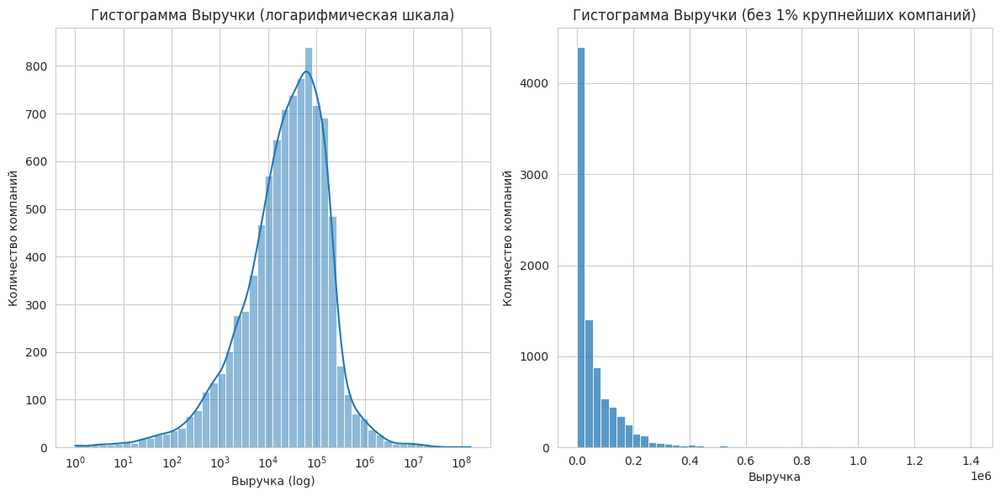



--- Анализ распределения Чистой прибыли (net_profit) ---
Описательная статистика для 'net_profit':
count         9,067
mean          8,356
std         160,865
min        -405,292
25%              -8
50%             782
75%           4,724
max      14,174,325
Name: net_profit, dtype: object


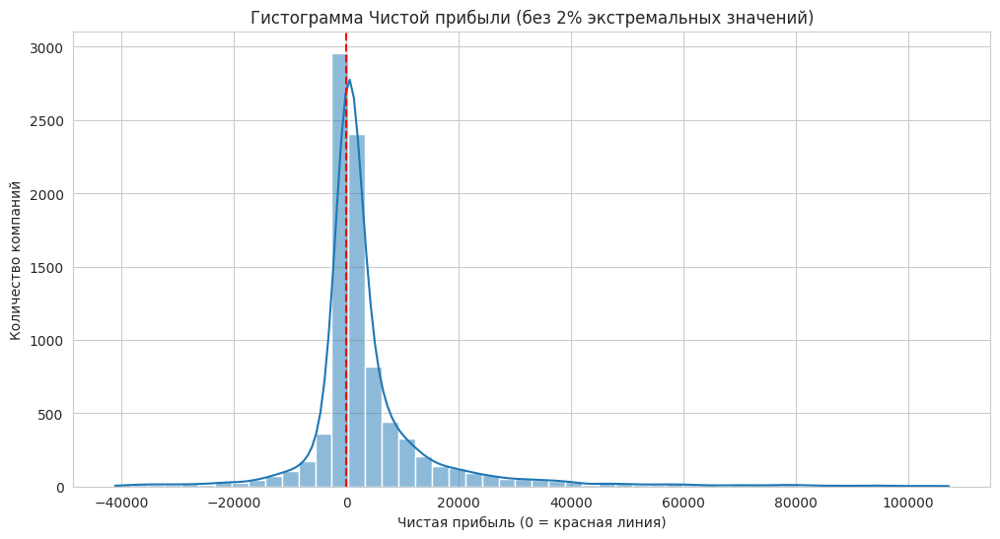


Соотношение прибыльных и убыточных компаний:
  - Прибыльные (> 0): 6691 (73.8%)
  - Убыточные (< 0): 2305 (25.4%)


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Устанавливаем стиль для графиков
sns.set_style("whitegrid")

# --- Шаг 1: Загрузка нашего очищенного датасета RFSD ---
print("--- Загрузка очищенного датасета RFSD ---")
try:
    rfsd_df = pd.read_parquet('data/rfsd_restaurants_moscow_2023_part.parquet')
    print(f"✅ Успешно загружено {len(rfsd_df)} записей.")
except FileNotFoundError:
    print("❗️ Файл 'data/rfsd_restaurants_moscow_2023_part.parquet' не найден.")
    raise FileNotFoundError

# --- Шаг 2: Визуальный анализ и статистика ---
if not rfsd_df.empty:
    print("\n--- Анализ распределения Выручки (revenue) ---")

    # 2.1 Описательная статистика для выручки
    print("Описательная статистика для 'revenue':")
    # Используем .describe() для получения основных метрик, форматируем для читаемости
    revenue_stats = rfsd_df['revenue'].describe()
    print(revenue_stats.apply(lambda x: f"{x:,.0f}"))

    # 2.2 Гистограмма для выручки
    # Данные о выручке имеют "длинный хвост" (очень большие значения).
    # Чтобы гистограмма была читаемой, мы "отрежем" выбросы.
    # Например, посмотрим на 99% данных, исключив 1% самых крупных компаний.
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    # Используем логарифмическую шкалу для наглядности
    sns.histplot(rfsd_df['revenue'], log_scale=True, bins=50, kde=True)
    plt.title('Гистограмма Выручки (логарифмическая шкала)')
    plt.xlabel('Выручка (log)')
    plt.ylabel('Количество компаний')

    plt.subplot(1, 2, 2)
    # Посмотрим на 99% данных без лог. шкалы
    revenue_quantile_99 = rfsd_df['revenue'].quantile(0.99)
    sns.histplot(rfsd_df[rfsd_df['revenue'] < revenue_quantile_99]['revenue'], bins=50)
    plt.title('Гистограмма Выручки (без 1% крупнейших компаний)')
    plt.xlabel('Выручка')
    plt.ylabel('Количество компаний')
    plt.tight_layout()
    plt.show()

    print("\n" + "="*50 + "\n")

    # 2.3 Анализ распределения Чистой прибыли (net_profit)
    print("--- Анализ распределения Чистой прибыли (net_profit) ---")

    # Описательная статистика для прибыли
    print("Описательная статистика для 'net_profit':")
    profit_stats = rfsd_df['net_profit'].describe()
    print(profit_stats.apply(lambda x: f"{x:,.0f}"))

    # Гистограмма для прибыли
    # Здесь тоже могут быть сильные выбросы (очень прибыльные или убыточные компании)
    plt.figure(figsize=(12, 6))
    # Отсечем 1% самых прибыльных и 1% самых убыточных для наглядности
    profit_quantile_01 = rfsd_df['net_profit'].quantile(0.01)
    profit_quantile_99 = rfsd_df['net_profit'].quantile(0.99)

    sns.histplot(
        rfsd_df[rfsd_df['net_profit'].between(profit_quantile_01, profit_quantile_99)]['net_profit'],
        bins=50,
        kde=True
    )
    # Добавим вертикальную линию на уровне нуля, чтобы отделить прибыльные от убыточных
    plt.axvline(0, color='red', linestyle='--')
    plt.title('Гистограмма Чистой прибыли (без 2% экстремальных значений)')
    plt.xlabel('Чистая прибыль (0 = красная линия)')
    plt.ylabel('Количество компаний')
    plt.show()

    # 2.4 Доля прибыльных/убыточных
    profit_not_null = rfsd_df['net_profit'].notna().sum()
    if profit_not_null > 0:
        profit_positive = (rfsd_df['net_profit'] > 0).sum()
        profit_negative = (rfsd_df['net_profit'] < 0).sum()

        print(f"\nСоотношение прибыльных и убыточных компаний:")
        print(f"  - Прибыльные (> 0): {profit_positive} ({profit_positive/profit_not_null*100:.1f}%)")
        print(f"  - Убыточные (< 0): {profit_negative} ({profit_negative/profit_not_null*100:.1f}%)")

else:
    print("Датафрейм RFSD пуст. Анализ невозможен.")

In [ ]:
!pip install folium

In [ ]:
import pandas as pd
import geopandas as gpd
import numpy as np
from sklearn.neighbors import BallTree
import folium
from folium.plugins import MarkerCluster

# --- Шаг 1: Загрузка и очистка данных ---
print("--- Загрузка и очистка данных ---")
# Загружаем
all_cafes_raw = pd.read_parquet('data/all_cafes_cleaned.parquet')
rfsd_df_raw = pd.read_parquet('data/rfsd_restaurants_moscow_2023_part.parquet')

# Очищаем
all_cafes = all_cafes_raw.copy()
all_cafes['lat'] = pd.to_numeric(all_cafes['lat'], errors='coerce')
all_cafes['lon'] = pd.to_numeric(all_cafes['lon'], errors='coerce')
all_cafes.dropna(subset=['lat', 'lon'], inplace=True)

rfsd_df = rfsd_df_raw.copy()
rfsd_df['lat'] = pd.to_numeric(rfsd_df['lat'], errors='coerce')
rfsd_df['lon'] = pd.to_numeric(rfsd_df['lon'], errors='coerce')
rfsd_df.dropna(subset=['lat', 'lon'], inplace=True)
print("✅ Данные загружены и очищены.")


# --- Шаг 2: Поиск ближайших соседей ---
print("\n--- Поиск ближайших соседей ---")
rfsd_radians = np.radians(rfsd_df[['lat', 'lon']].values)
tree = BallTree(rfsd_radians, leaf_size=15)
cafes_radians = np.radians(all_cafes[['lat', 'lon']].values)

distances, indices = tree.query(cafes_radians, k=1)

# Добавляем информацию о найденном соседе в датафрейм кофеен
earth_radius_m = 6371000
all_cafes['distance_to_rfsd_m'] = (distances * earth_radius_m).round(1)
all_cafes['matched_rfsd_index'] = indices.flatten()
print("✅ Поиск завершен.")


# --- Шаг 3: Разделение на "пары" и "одиночные" ---
print("\n--- Разделение на группы ---")
DISTANCE_THRESHOLD = 50  # Наш порог в метрах
matched_cafes = all_cafes[all_cafes['distance_to_rfsd_m'] <= DISTANCE_THRESHOLD].copy()
unmatched_cafes = all_cafes[all_cafes['distance_to_rfsd_m'] > DISTANCE_THRESHOLD].copy()

# Находим соответствующие "пары" из RFSD
matched_rfsd_indices = matched_cafes['matched_rfsd_index'].unique()
matched_rfsd = rfsd_df.iloc[matched_rfsd_indices].copy()

# Находим "одиночные" RFSD (все, кроме сопоставленных)
unmatched_rfsd = rfsd_df.drop(index=matched_rfsd_indices).copy()

print(f"Найдено {len(matched_cafes)} пар (расстояние <= {DISTANCE_THRESHOLD}м).")


# --- Шаг 4: Создание интерактивной карты ---
print("\n--- Создание интерактивной карты ---")
map_center = [all_cafes['lat'].mean(), all_cafes['lon'].mean()]
m = folium.Map(location=map_center, zoom_start=10)

# Слои для одиночных точек
unmatched_cafes_layer = folium.FeatureGroup(name=f'Одиночные кофейни ({len(unmatched_cafes)})').add_to(m)

# --- ВОТ ИСПРАВЛЕНИЕ: убираем show=False ---
unmatched_rfsd_layer = folium.FeatureGroup(name=f'Одиночные юр. адреса ({len(unmatched_rfsd)})').add_to(m)
# --- КОНЕЦ ИСПРАВЛЕНИЯ ---

# Слой для сопоставленных пар
matched_layer = folium.FeatureGroup(name=f'Найденные пары ({len(matched_cafes)})').add_to(m)

# 4.1. Отрисовка одиночных кофеен (красные)
for idx, row in unmatched_cafes.iterrows():
    folium.CircleMarker(location=[row['lat'], row['lon']], radius=4, color='red', fill=True, fill_color='red', fill_opacity=0.6, popup=f"<b>{row['name']}</b><br>Источник: {row['source']}").add_to(unmatched_cafes_layer)

# 4.2. Отрисовка одиночных юр. адресов (синие)
for idx, row in unmatched_rfsd.iterrows():
    folium.CircleMarker(location=[row['lat'], row['lon']], radius=4, color='blue', fill=True, fill_color='blue', fill_opacity=0.6, popup=f"ИНН: {row['inn']}").add_to(unmatched_rfsd_layer)

# 4.3. Отрисовка СОПОСТАВЛЕННЫХ пар (зеленые) и линий между ними
# (этот блок остается без изменений)
for idx, cafe in matched_cafes.iterrows():
    rfsd_match = rfsd_df.iloc[cafe['matched_rfsd_index']]
    folium.CircleMarker(location=[cafe['lat'], cafe['lon']], radius=5, color='green', fill=True, fill_color='#32CD32', fill_opacity=0.8, popup=f"<b>{cafe['name']}</b><br>Расстояние: {cafe['distance_to_rfsd_m']} м").add_to(matched_layer)
    folium.RegularPolygonMarker(location=[rfsd_match['lat'], rfsd_match['lon']], number_of_sides=4, radius=6, color='darkgreen', fill=True, fill_color='green', fill_opacity=0.8, popup=f"<b>Пара для {cafe['name']}</b><br>ИНН: {rfsd_match['inn']}").add_to(matched_layer)
    folium.PolyLine(locations=[(cafe['lat'], cafe['lon']), (rfsd_match['lat'], rfsd_match['lon'])], color='green', weight=1.5, opacity=0.8).add_to(matched_layer)

# Добавляем контроллер слоев
folium.LayerControl().add_to(m)

# Отображаем карту
print("✅ Карта готова.")
m

--- Загрузка и очистка данных ---
✅ Данные загружены и очищены.

--- Поиск ближайших соседей ---
✅ Поиск завершен.

--- Разделение на группы ---
Найдено 205 пар (расстояние <= 50м).

--- Создание интерактивной карты ---
✅ Карта готова.


In [ ]:
import pandas as pd
import numpy as np

# Загружаем наш самый полный и чистый датасет кофеен
cafes_df = pd.read_parquet('data/all_cafes_cleaned.parquet')

print("--- Анализ и обработка 'price_category' ---")

# Посмотрим, какие значения там есть и сколько их
print("Исходное распределение 'price_category':")
print(cafes_df['price_category'].value_counts(dropna=False))

# Создаем функцию для преобразования '1/4' в число 1
def parse_price_category(value):
    if isinstance(value, str) and '/' in value:
        try:
            # Берем первую цифру до слэша
            return int(value.split('/')[0])
        except (ValueError, IndexError):
            return np.nan
    return np.nan

# Применяем функцию
cafes_df['price_level'] = cafes_df['price_category'].apply(parse_price_category)

# Проверяем результат
print("\nИтоговое распределение числового 'price_level':")
print(cafes_df['price_level'].value_counts())

# Теперь cafes_df содержит новую полезную колонку 'price_level'.
# Этот датафрейм мы будем использовать для всех дальнейших шагов по созданию признаков.
print("\nПример данных с новой колонкой:")
print(cafes_df[['name', 'price_category', 'price_level']].head())

# (Опционально) Сохраняем этот промежуточный результат
cafes_df.to_parquet('data/cafes_with_price_level.parquet')

--- Анализ и обработка 'price_category' ---
Исходное распределение 'price_category':
price_category
None    841
1/4     442
2/4      47
3/4      22
4/4       2
Name: count, dtype: int64

Итоговое распределение числового 'price_level':
price_level
1.0    442
2.0     47
3.0     22
4.0      2
Name: count, dtype: int64

Пример данных с новой колонкой:
          name price_category  price_level
0     Школьник            1/4          1.0
1  Coffeemolka            1/4          1.0
2  Шоколадница            1/4          1.0
3    Кофе Хауз            1/4          1.0
4  Шоколадница            1/4          1.0



ВИЗУАЛИЗАЦИЯ ЗАВИСИМОСТИ: ВЫРУЧКА vs. КОЛ-ВО ОТЗЫВОВ


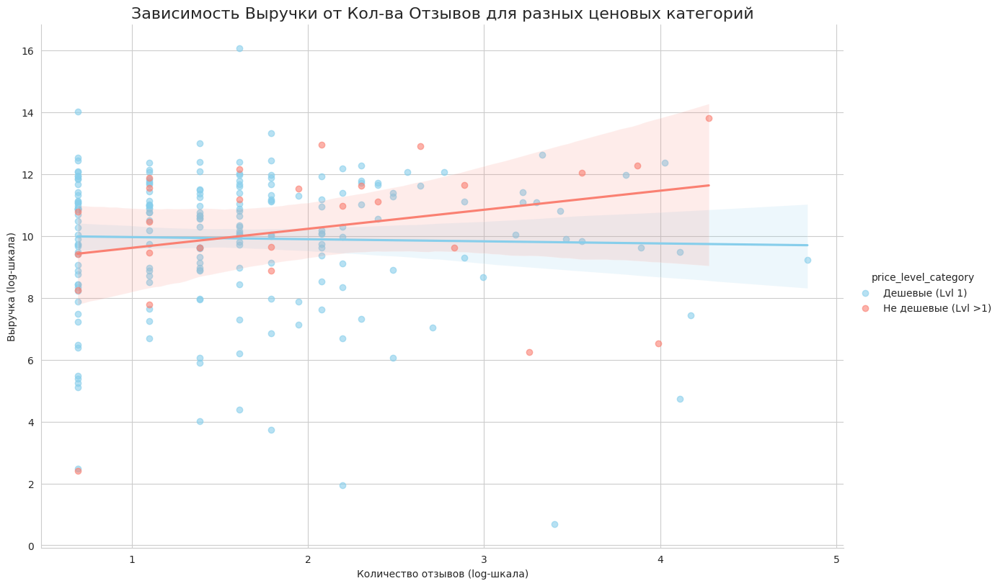

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# --- Шаг 1: Подготовка данных (как и раньше) ---
# Этот блок остается без изменений: мы загружаем, мэтчим и создаем 'золотой' датасет,
# а затем 'analysis_df' с очищенными колонками и разделением на категории.
# ... (код из предыдущего ответа до конца Шага 2)
# ...
# В итоге у нас должен быть 'analysis_df' с колонкой 'price_level_category'
# ... (скопируйте сюда весь код подготовки данных до Шага 3 из предыдущего ответа)

# Предположим, 'analysis_df' уже создан и готов
# analysis_df['price_level_category'] = np.where(analysis_df['price_level'] > 1, 'Не дешевые (Lvl >1)', 'Дешевые (Lvl 1)')


# --- Шаг 2: Визуализация зависимости ---
if 'analysis_df' in locals() and not analysis_df.empty:
    print("\n" + "="*50)
    print("ВИЗУАЛИЗАЦИЯ ЗАВИСИМОСТИ: ВЫРУЧКА vs. КОЛ-ВО ОТЗЫВОВ")
    print("="*50)

    # 2.1. Используем логарифмические шкалы для наглядности
    # Это "растянет" плотные скопления точек и сделает картину яснее
    analysis_df['log_reviews_count'] = np.log1p(analysis_df['reviews_count'])
    analysis_df['log_revenue'] = np.log1p(analysis_df['rfsd_revenue'])

    # 2.2. Строим график с помощью seaborn.lmplot
    # lmplot идеально подходит, так как он строит и диаграмму рассеяния, и линию регрессии
    sns.lmplot(
        data=analysis_df,
        x='log_reviews_count',
        y='log_revenue',
        hue='price_level_category', # Разделяем точки и линии по нашей категории
        palette={'Дешевые (Lvl 1)': 'skyblue', 'Не дешевые (Lvl >1)': 'salmon'},
        height=8, # Размер графика
        aspect=1.5, # Соотношение сторон
        scatter_kws={'alpha':0.6} # Прозрачность точек
    )

    plt.title('Зависимость Выручки от Кол-ва Отзывов для разных ценовых категорий', fontsize=16)
    plt.xlabel('Количество отзывов (log-шкала)')
    plt.ylabel('Выручка (log-шкала)')
    plt.grid(True)
    plt.show()

else:
    print("\nДатафрейм 'analysis_df' не был создан или пуст. Визуализация невозможна.")

--- Загрузка и гео-сопоставление ---

--- Подготовка данных для анализа ---
Создан 'золотой' датасет из 205 сопоставленных кофеен.
Итоговое количество ПОЛНЫХ записей для анализа корреляции: 73

--- Визуализация корреляций ---


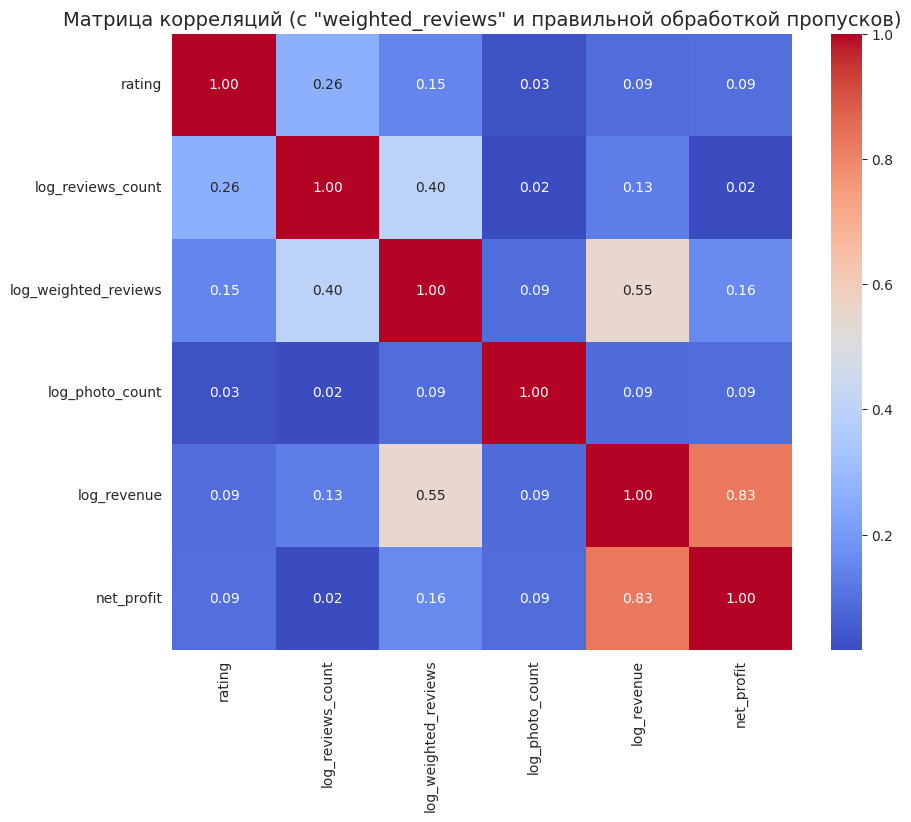

In [ ]:
import pandas as pd
import geopandas as gpd
import numpy as np
from sklearn.neighbors import BallTree
import seaborn as sns
import matplotlib.pyplot as plt

# --- Шаг 1 и 2 (без изменений) ---
print("--- Загрузка и гео-сопоставление ---")
all_cafes_full = pd.read_parquet('data/all_cafes_cleaned.parquet')
rfsd_df = pd.read_parquet('data/rfsd_restaurants_moscow_2023_part.parquet')
# ... (весь код очистки и гео-сопоставления до создания golden_dataset) ...
all_cafes_full['lat'] = pd.to_numeric(all_cafes_full['lat'], errors='coerce')
all_cafes_full['lon'] = pd.to_numeric(all_cafes_full['lon'], errors='coerce')
all_cafes_full.dropna(subset=['lat', 'lon'], inplace=True)
rfsd_df['lat'] = pd.to_numeric(rfsd_df['lat'], errors='coerce')
rfsd_df['lon'] = pd.to_numeric(rfsd_df['lon'], errors='coerce')
rfsd_df.dropna(subset=['lat', 'lon'], inplace=True)
rfsd_radians = np.radians(rfsd_df[['lat', 'lon']].values)
tree = BallTree(rfsd_radians, leaf_size=15)
cafes_radians = np.radians(all_cafes_full[['lat', 'lon']].values)
distances, indices = tree.query(cafes_radians, k=1)
earth_radius_m = 6371000
all_cafes_full['distance_to_rfsd_m'] = (distances * earth_radius_m).round(1)
matched_rfsd_data = rfsd_df.iloc[indices.flatten()].reset_index(drop=True)
all_cafes_full['rfsd_revenue'] = matched_rfsd_data['revenue']
all_cafes_full['rfsd_net_profit'] = matched_rfsd_data['net_profit']

# --- Шаг 3: Создание "золотого" датасета и НОВЫХ признаков ---
print("\n--- Подготовка данных для анализа ---")
DISTANCE_THRESHOLD = 50
golden_dataset = all_cafes_full[all_cafes_full['distance_to_rfsd_m'] <= DISTANCE_THRESHOLD].copy()
print(f"Создан 'золотой' датасет из {len(golden_dataset)} сопоставленных кофеен.")

analysis_df = golden_dataset[golden_dataset['source'] == 'Zoon'].copy()

# --- Создаем признак 'price_level' БЕЗ ЗАПОЛНЕНИЯ ПРОПУСКОВ ---
def parse_price_category(value):
    """
    Преобразует строковую категорию цены ('1/4', '2/4' и т.д.)
    в примерное значение среднего чека в рублях.
    """
    # Словарь для сопоставления
    price_map = {
        '1/4': 0,   # Среднее для категории "до 1000"
        '2/4': 1,  # Среднее для категории "1000-1500"
        '3/4': 1,  # Среднее для категории "1500-2500"
        '4/4': 1   # Примерное значение для категории "больше 2500"
    }

    # Проверяем, что на вход пришла строка
    if isinstance(value, str):
        # Возвращаем значение из словаря. Если ключа нет, .get() вернет None.
        return price_map.get(value)

    # Если на вход пришло не строковое значение, возвращаем NaN
    return np.nan
analysis_df['price_level'] = analysis_df['price_category'].apply(parse_price_category)

# Преобразуем 'reviews_count' в число
analysis_df['reviews_count'] = pd.to_numeric(analysis_df['reviews_count'], errors='coerce')
analysis_df['photo_count'] = pd.to_numeric(analysis_df['photo_count'], errors='coerce')

# --- Создаем 'weighted_reviews' ---
analysis_df['weighted_reviews'] = analysis_df['reviews_count'] * analysis_df['price_level'] * analysis_df['rating']
# Важно: если price_level был NaN, то и weighted_reviews станет NaN. Это правильно.

# --- Финальная очистка: удаляем строки, где отсутствует ЛЮБОЙ из нужных нам показателей ---
cols_for_analysis = ['rating', 'reviews_count', 'photo_count', 'rfsd_revenue', 'rfsd_net_profit', 'weighted_reviews']
analysis_df.dropna(subset=cols_for_analysis, inplace=True)

# Логарифмируем
analysis_df['log_reviews_count'] = analysis_df['reviews_count']
analysis_df['log_photo_count'] = analysis_df['photo_count']
analysis_df['log_revenue'] = analysis_df['rfsd_revenue']
analysis_df['log_weighted_reviews'] = analysis_df['weighted_reviews']
analysis_df.rename(columns={'rfsd_net_profit': 'net_profit'}, inplace=True)

print(f"Итоговое количество ПОЛНЫХ записей для анализа корреляции: {len(analysis_df)}")


# --- Шаг 4: Построение визуализаций ---
if len(analysis_df) > 1:
    print("\n--- Визуализация корреляций ---")

    final_cols_for_corr = ['rating', 'log_reviews_count', 'log_weighted_reviews', 'log_photo_count', 'log_revenue', 'net_profit']
    corr_df = analysis_df[final_cols_for_corr]

    plt.figure(figsize=(10, 8))
    correlation_matrix = corr_df.corr()
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('Матрица корреляций (с "weighted_reviews" и правильной обработкой пропусков)', fontsize=14)
    plt.show()
else:
    print("\nНедостаточно данных для построения корреляционной матрицы.")


In [ ]:
import pandas as pd
import geopandas as gpd
import numpy as np
from sklearn.neighbors import BallTree

# --- ШАГ 0: Загрузка данных ---
print("--- Шаг 0: Загрузка данных ---")
all_cafes_raw = pd.read_parquet('data/all_cafes_cleaned.parquet')
rfsd_restaurants_raw = pd.read_parquet('data/rfsd_restaurants_moscow_2023_part.parquet')

# --- ИСПРАВЛЕНИЕ: Приведение типов координат к числовому формату ---
print("\n--- Приведение типов координат к числовому формату ---")

# Для датасета кофеен
all_cafes = all_cafes_raw.copy()
all_cafes['lat'] = pd.to_numeric(all_cafes['lat'], errors='coerce')
all_cafes['lon'] = pd.to_numeric(all_cafes['lon'], errors='coerce')
# Удаляем строки, где координаты не смогли стать числами
all_cafes.dropna(subset=['lat', 'lon'], inplace=True)

# Для датасета RFSD
rfsd_restaurants = rfsd_restaurants_raw.copy()
rfsd_restaurants['lat'] = pd.to_numeric(rfsd_restaurants['lat'], errors='coerce')
rfsd_restaurants['lon'] = pd.to_numeric(rfsd_restaurants['lon'], errors='coerce')
rfsd_restaurants.dropna(subset=['lat', 'lon'], inplace=True)

print("✅ Координаты в обоих датасетах преобразованы в числа.")
# --- КОНЕЦ ИСПРАВЛЕНИЯ ---


# Создаем GeoDataFrame для RFSD (для all_cafes он уже должен быть Geo)
rfsd_restaurants = gpd.GeoDataFrame(
    rfsd_restaurants,
    geometry=gpd.points_from_xy(rfsd_restaurants.lon, rfsd_restaurants.lat),
    crs="EPSG:4326"
)

# Убедимся, что all_cafes тоже является GeoDataFrame
if not isinstance(all_cafes, gpd.GeoDataFrame):
    all_cafes = gpd.GeoDataFrame(
        all_cafes,
        geometry=gpd.points_from_xy(all_cafes.lon, all_cafes.lat),
        crs="EPSG:4326"
    )


# --- ШАГ 1: Поиск ближайшего соседа (Гео-поиск) ---
print("\n--- Шаг 1: Поиск ближайшей компании из RFSD для каждой кофейни ---")

# Готовим данные для поиска
rfsd_radians = np.radians(rfsd_restaurants[['lat', 'lon']].values)
tree = BallTree(rfsd_radians, leaf_size=15)
cafes_radians = np.radians(all_cafes[['lat', 'lon']].values)

distances, indices = tree.query(cafes_radians, k=1)

# --- ШАГ 2: Создание итогового датафрейма ---
print("\n--- Шаг 2: Создание итогового датафрейма ---")
earth_radius_m = 6371000
all_cafes['distance_to_rfsd_m'] = (distances * earth_radius_m).round(1)
matched_rfsd_data = rfsd_restaurants.iloc[indices.flatten()].reset_index(drop=True)
all_cafes['rfsd_revenue'] = matched_rfsd_data['revenue']
all_cafes['rfsd_net_profit'] = matched_rfsd_data['net_profit']
all_cafes['rfsd_inn'] = matched_rfsd_data['inn']

# --- ШАГ 3: Фильтрация и анализ результата ---
print("\n--- Шаг 3: Анализ результата ---")
distance_threshold_m = 50
successful_matches = all_cafes[all_cafes['distance_to_rfsd_m'] <= distance_threshold_m]
print(f"Найдено {len(successful_matches)} успешных совпадений (расстояние <= {distance_threshold_m} м).")
print("\nПримеры успешно сопоставленных кофеен:")
print(successful_matches[['name', 'rating', 'distance_to_rfsd_m', 'rfsd_revenue', 'rfsd_net_profit']].head())

# --- ШАГ 4: Сохранение финального тренировочного датасета ---
print("\n--- Шаг 4: Сохранение ---")
output_filename = 'data/final_training_dataset.parquet'
successful_matches.to_parquet(output_filename)
print(f"✅ Финальный тренировочный датасет сохранен в: {output_filename}")


--- Шаг 0: Загрузка данных ---

--- Приведение типов координат к числовому формату ---
✅ Координаты в обоих датасетах преобразованы в числа.

--- Шаг 1: Поиск ближайшей компании из RFSD для каждой кофейни ---

--- Шаг 2: Создание итогового датафрейма ---

--- Шаг 3: Анализ результата ---
Найдено 205 успешных совпадений (расстояние <= 50 м).

Примеры успешно сопоставленных кофеен:
              name  rating  distance_to_rfsd_m  rfsd_revenue  rfsd_net_profit
7   Кофейное древо     4.3                39.0       42292.0          -7783.0
12   Star hit cafe     3.7                36.7        7095.0            644.0
17     Шоколадница     3.0                25.3       81912.0            353.0
25     Шоколадница     2.9                41.8       16615.0              4.0
27        CofeFest     4.3                48.6      130705.0           3416.0

--- Шаг 4: Сохранение ---
✅ Финальный тренировочный датасет сохранен в: data/final_training_dataset.parquet
